In [1]:
import cv2
import pandas as pd
from math import atan2,degrees
import numpy as np
from os.path import join
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
%config InlineBackend.figure_format='retina'

In [2]:
image_location = "DroneImages/"
CSV_LOCATION = "./square_coords.csv"
CH_NAMES = ["red", "green", "blue", "red edge", "nir"]
IMAGE_MARGIN = 50  # margin around each calibration point

In [3]:
# def mtvi_index(ch_nir, ch_red, c): 
#     '''
#     used with poor vegtation
#     '''
#     return np.sqrt((c * ch_nir - ch_red )/(c * ch_nir + ch_red ))


def ndvi_index(img):
    '''
    normalized difference vegetation index
    '''
    ch_nir, ch_red = img[...,4], img[...,0]
    return (ch_nir-ch_red)/(ch_nir+ch_red)

def ndvi_index_with_threshhold(img, thresh=0.4):
    ndvi = ndvi_index(img)

    return np.where(ndvi > thresh, 1., ndvi)


def msr_index(img):
    '''
    improved vegetation sensitivity
    '''
    ch_nir, ch_red = img[...,4], img[...,0]
    ratio = ch_nir/ch_red
    return (ratio - 1)/np.sqrt(ratio + 1)

def tvi_index(img):
    '''
    modifies NDVI with only positive values
    < 0.71 as non-vegetation
    > 0.71 as vegetation
    '''
    ch_nir, ch_red = img[...,4], img[...,0]
    ratio = ch_nir/ch_red
    return np.sqrt((ratio - 1)/(ratio + 1)+0.5)


# def mtvi_index(img, c):
#     '''
#     used with poor vegtation
#     '''
#     ch_nir, ch_red = img[...,4], img[...,0]
#     return np.sqrt((c * ch_nir - ch_red)/(c * ch_nir + ch_red))


def gndvi_index(img):
    '''
    green NDVI
    '''
    ch_nir, ch_green = img[...,4], img[...,1]
    return (ch_nir-ch_green)/(ch_nir+ch_green)


def gci_index(img):
    '''
    Green Chlorophyll Index
    '''
    ch_nir, ch_green = img[...,4], img[...,1]
    return (ch_nir/ch_green) - 1

def savi_index(img):
    '''
    Soil Adjusted Vegetation Index
    '''
    ch_nir, ch_red = img[...,4], img[...,0]
    return 1.5 * (ch_nir - ch_red) / (ch_nir + ch_red + 0.5)


def evi_index(img):
    '''
    Enhanced Vegetation Index
    '''
    ch_nir, ch_red, ch_blue = img[...,4], img[...,0], img[...,2]
    return 2.5 * (ch_nir - ch_red) / (1 + ch_nir + 6 * ch_red - 7.5 * ch_blue)


def ndvi_index_with_threshhold(img, thresh):
    ndvi = ndvi_index(img)

    return np.where(ndvi > thresh, 1., ndvi)


In [4]:
def _normalize_img(im):
    mean, std = np.nanmean(im), np.nanstd(im)
    return (im - mean)/std

In [5]:
def _get_widthnangle(df):
    angles = []
    widths = []
    for i, row in df.iterrows():
        angles.append(atan2(row["tr_y"] - row["tl_y"],
                            row["tr_x"] - row["tl_x"]))
        widths.append(np.linalg.norm([row["tr_x"] - row["tl_x"],row["tr_y"] - row["tl_y"]]))
    df["angle"] = pd.Series(angles)  # angle from the top left calibration square to the top right
    df["width"] = pd.Series(widths)  # width from top left calibration square to the top right
    return df

In [6]:
def _transform_dfpoints(row, mat):
    points = iter(row.drop(["fileprefix", "width","angle"]).index)
    for x in points:
        y = next(points)
        arr = np.array([[row[x]],[row[y]],[1.]], dtype=np.float32)
        nx, ny = np.matmul(mat, arr)
        row[x], row[y] = nx, ny
    return row

In [7]:
def get_indeces(rotated):
    ndvi_index_r = ndvi_index(rotated)
    msr_index_r = msr_index(rotated)
    tvi_index_r = tvi_index(rotated)
    gndvi_index_r = gndvi_index(rotated)
    gci_index_r = gci_index(rotated)
    savi_index_r = savi_index(rotated)
    evi_index_r = evi_index(rotated)

    ndvi_index_r_7 = ndvi_index_with_threshhold(rotated, 0.7)
    ndvi_index_r_725 = ndvi_index_with_threshhold(rotated, 0.725)
    ndvi_index_r_75 = ndvi_index_with_threshhold(rotated, 0.75)
    ndvi_index_r_775 = ndvi_index_with_threshhold(rotated, 0.775)
    ndvi_index_r_8 = ndvi_index_with_threshhold(rotated, 0.8)
    ndvi_index_r_825 = ndvi_index_with_threshhold(rotated, 0.825)
    
    indeces = [ndvi_index_r, msr_index_r, tvi_index_r, gndvi_index_r, gci_index_r, savi_index_r, evi_index_r, 
           ndvi_index_r_7, ndvi_index_r_725, ndvi_index_r_75, ndvi_index_r_775, ndvi_index_r_8, ndvi_index_r_825]
    return indeces

In [8]:
def viz_preprocess(img):
    """Returns a 3-channel image (or 1-channel, if the input is 1-channel) with a 0-255 RGB
    image normalized on those 3 channels. Should look fine for visualization."""
    if len(img.shape) == 2:
        img = img.copy()
    elif len(img.shape) >= 3:
        img = img[...,:3].copy()
    else:
        raise TypeError("Wrong type of image")
    img = _normalize_img(img)
    return cv2.normalize(img, img, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

In [9]:
features = ['red', 'green', 'blue', 'red_edge', 'nir', 
            'ndvi', 'msr', 'tvi', 'gndvi', 'gci', 'savi', 'evi',
            'ndvi_0_7', 'ndvi_0_725', 'ndvi_0_75', 'ndvi_0_775', 'ndvi_0_8', 'ndvi_0_825']

In [10]:
def _preprocess_single_image(row, minwidth, minheight, image_location):
    channels = []
    paths = [join(image_location, f"{row['fileprefix']}_{channel}.tif") for channel in CH_NAMES]
    for fp in paths:
        channels.append(cv2.imread(fp, cv2.IMREAD_ANYDEPTH))

    img = cv2.merge(channels)
    img[img < 0] = float(0)  # -10000 empty pixels become NaN
#     img = _normalize_img(img)

    # rotate around the top left calibration point
    ctr = tuple(i.item() for i in row[["tl_x", "tl_y"]].values)
    rotmat = cv2.getRotationMatrix2D(center=ctr,
                                     angle=degrees(row["angle"]),
                                     scale=minwidth/row["width"])

    row = _transform_dfpoints(row, rotmat)  # record rotation in the dataframe

    rotated = cv2.warpAffine(img,  # rotate image itself
                             M=rotmat,
                             dsize=(int(row["tr_x"])+2*IMAGE_MARGIN,
                                    int(row["bl_y"]+2*IMAGE_MARGIN)))
    transmat = np.array([[1, 0, -int(row["tl_x"] - IMAGE_MARGIN)],  # translation matrix
                         [0, 1, -int(row["tl_y"] - IMAGE_MARGIN)]], dtype=np.float32)

    row = _transform_dfpoints(row, transmat)  # apply in dataframe

    rotated = cv2.warpAffine(rotated,  # apply translation to image
                             M=transmat,
                             dsize=(int(row["br_x"]+IMAGE_MARGIN), int(row["br_y"]+IMAGE_MARGIN)))

    # final size adjustment, resizes only by ~20 pixels max.
    rotated = cv2.resize(rotated,
                         (int(minwidth + 2*IMAGE_MARGIN), int(minheight + 2*IMAGE_MARGIN)),
                         interpolation=cv2.INTER_CUBIC)

    return rotated

In [11]:
def block_breakup(img, top=0, bottom=0, left=0, right=0):
    coords = []
    if len(img.shape) == 2:
        img = img[..., np.newaxis]

    lines = open("plot_corners.csv", "r").readlines()
    for line in lines:
        line = tuple(int(i) for i in (line.rstrip().split(",")))
        coords.append(line)
    coords = np.array(coords, dtype=np.int32)
    leftside, rightside = coords[0::2], coords[1::2]  # csv file alternates left and right plots
    xleft, xright = int(np.mean(leftside[:,0])), int(np.mean(rightside[:,0]))

    prevy = 0
    for pt in reversed(leftside):
        yield img[prevy+top:pt[1]-bottom, 0+left:xleft-right, :]
        prevy = pt[1]
    prevy = 0
    for pt in reversed(rightside):
        yield img[prevy+top:pt[1]-bottom, xright+left:img.shape[1]-right, :]
        prevy = pt[1]

# IMAGE EDA

In [12]:
calib = pd.read_csv(CSV_LOCATION)
calib = _get_widthnangle(calib)
minheight = 3021
minwidth = 1185

# minwidth = calib["width"].min()  # For scaling each image to the smallest image.
# calib.drop(index=6, axis=0, inplace=True)  # There's an image where the crop gets cut off.
for i in range(len(calib)):
    row = calib.iloc[i]
    print(i, row)

0 fileprefix    NobalWheat_NUE_10-8-2021_20m_transparent_refle...
tl_x                                                        929
tl_y                                                       1462
tr_x                                                       2146
tr_y                                                        891
bl_x                                                       2356
bl_y                                                       4561
br_x                                                       3590
br_y                                                       3989
middle_x                                                   2035
middle_y                                                   2773
angle                                                 -0.438694
width                                                    1344.3
Name: 0, dtype: object
1 fileprefix    NobalWheat_NUE_12-7-2021_20m_transparent_refle...
tl_x                                                        952
tl_y         

In [13]:
row

fileprefix    NobalWheat_NUE_7-6-2021_20m_transparent_reflec...
tl_x                                                        597
tl_y                                                        990
tr_x                                                       1779
tr_y                                                        438
bl_x                                                       2012
bl_y                                                       4053
br_x                                                       3231
br_y                                                       3485
middle_x                                                   1649
middle_y                                                   2284
angle                                                 -0.436905
width                                                   1304.54
Name: 10, dtype: object

In [14]:
rotated = _preprocess_single_image(row, minwidth, minheight, image_location)

/Users/anhelinalohvina/opt/anaconda3/envs/Daily/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [15]:
rotated.shape

(3121, 1285, 5)

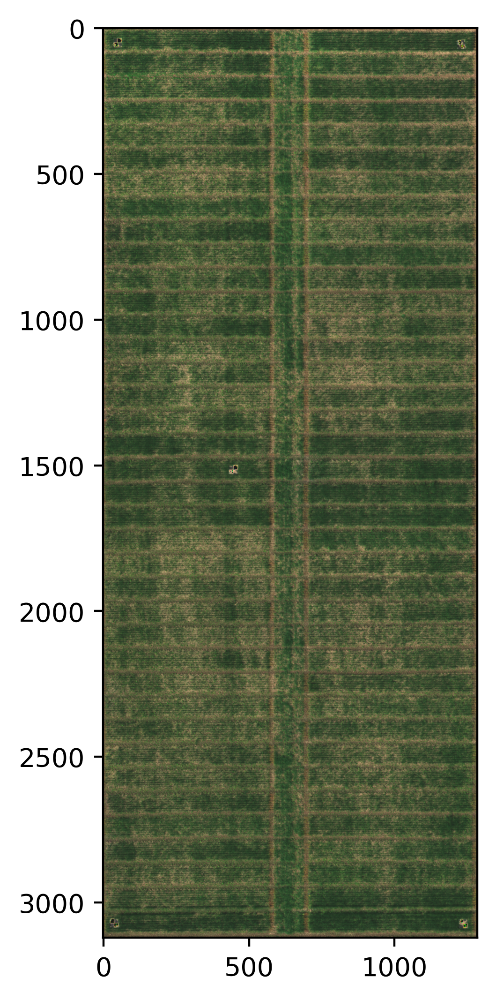

In [17]:
img = viz_preprocess(rotated)
my_dpi = 200
plt.figure(figsize=(image_viz.shape[0]/my_dpi, image_viz.shape[1]/my_dpi), dpi =my_dpi)
plt.imshow(img)

In [18]:
indeces = get_indeces(rotated)

print(len(indeces))

for index in indeces:
    rotated = np.concatenate([rotated, np.expand_dims(index, axis=-1)], axis=-1)

/Users/anhelinalohvina/opt/anaconda3/envs/Daily/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]
/Users/anhelinalohvina/opt/anaconda3/envs/Daily/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: divide by zero encountered in true_divide
/Users/anhelinalohvina/opt/anaconda3/envs/Daily/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/Users/anhelinalohvina/opt/anaconda3/envs/Daily/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in sqrt
/Users/anhelinalohvina/opt/anaconda3/envs/Daily/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in true_divide
/Users/anhelinalohvina/opt/anaconda3/envs/Daily/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: divide by zero encountered in true_divide
/Users/anhelinalohvina/opt/anacon

13


In [19]:
rotated.shape

(3121, 1285, 18)

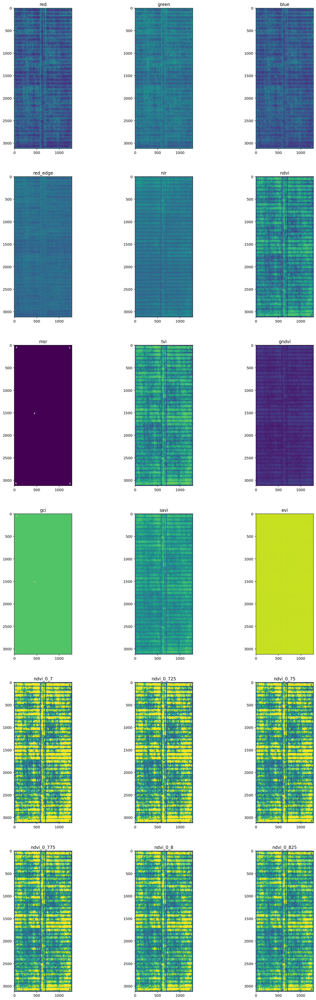

In [20]:
columns = 3
rows = 6
plt.figure(figsize=(17, 50)) 
for i in range(columns*rows):
    image = rotated[...,i]
    plt.subplot(rows, columns, i+1)
    plt.title(features[i])
    plt.imshow(image)
plt.show()

In [21]:
blocks_7_6 = list(block_breakup(rotated, top=20, bottom=0, left=5, right=5))

# Model

In [45]:
def kmeans_model(rotated, season = 'later', wind = False, features = ['red', 'green', 'blue', 'red_edge', 'nir', 
            'ndvi', 'msr', 'tvi', 'gndvi', 'gci', 'savi', 'evi',
            'ndvi_0_7', 'ndvi_0_725', 'ndvi_0_75', 'ndvi_0_775', 'ndvi_0_8', 'ndvi_0_825']):
    
    blocks= list(block_breakup(rotated, top=20, bottom=0, left=5, right=5))
    stats = []
    data_all = pd.DataFrame()
    concat_list = [0]
    shapes = []
    
    if season == 'early':
        for block in blocks:
            rotated = block
            image_k_means = rotated.reshape(rotated.shape[0] * rotated.shape[1], rotated.shape[2])
            shapes.append([rotated.shape[0],rotated.shape[1]])
            concat_list.append(image_k_means.shape[0])
            data = pd.DataFrame(image_k_means, columns = features)
            data_all = pd.concat([data_all,data],axis=0)
        
        split_ind = np.cumsum(concat_list)

        data = data_all
        pd.set_option('use_inf_as_na', True)
        np.any(np.isnan(data.fillna(0)))
        pd.set_option('use_inf_as_na', True)
        np.any(np.isfinite(data.fillna(0)))

        data = data.fillna(0)
        X_std = StandardScaler().fit_transform(data)
        X_std_df = pd.DataFrame(X_std, columns = features)

        kmeans = KMeans(n_clusters = 3, random_state=42)
        masked_img = kmeans.fit_predict(X_std_df)

        l = concat_list
        i = np.cumsum(l)

        r = masked_img
        s = shapes

        masked_blocks = []

        for index in range(len(i)-1):
            masked_img = r[i[index]:i[index+1]]
            image = masked_img.reshape(s[index][0], s[index][1])
            masked_blocks.append(image) 
            stats.append(Counter(image.flat))
            
        return masked_blocks, stats
        
    
    if season == 'later':
        if wind:
            for block in blocks:
                rotated = block
                image_k_means = rotated.reshape(rotated.shape[0] * rotated.shape[1], rotated.shape[2])
                shapes.append([rotated.shape[0],rotated.shape[1]])
                concat_list.append(image_k_means.shape[0])
                data = pd.DataFrame(image_k_means, columns = features)
                data_all = pd.concat([data_all,data],axis=0)
        
            split_ind = np.cumsum(concat_list)
        
            data = data_all
            pd.set_option('use_inf_as_na', True)
            np.any(np.isnan(data.fillna(0)))
            pd.set_option('use_inf_as_na', True)
            np.any(np.isfinite(data.fillna(0)))

            data = data.fillna(0)
            X_std = StandardScaler().fit_transform(data)
            X_std_df = pd.DataFrame(X_std, columns = features)

            kmeans = KMeans(n_clusters = 3, random_state=42)
            masked_img = kmeans.fit_predict(X_std_df)

            l = concat_list
            i = np.cumsum(l)

            r = masked_img
            s = shapes
        
            masked_blocks = []
            
            for index in range(len(i)-1):
                masked_img = r[i[index]:i[index+1]]
                image = masked_img.reshape(s[index][0], s[index][1])
                counts = np.bincount(image.flat)
                masked_2_classes = np.where(image != np.argmin(counts), 0.5, image)
                masked_blocks.append(masked_2_classes) 
                stats.append(Counter(masked_2_classes.flat))
            
            return masked_blocks, stats
        
        else:
            masked_blocks = []
            for block in blocks:
                rotated = block
                image_k_means = rotated.reshape(rotated.shape[0] * rotated.shape[1], rotated.shape[2])
                data = pd.DataFrame(image_k_means, columns = features)
                pd.set_option('use_inf_as_na', True)
                np.any(np.isnan(data.fillna(0)))
                pd.set_option('use_inf_as_na', True)
                np.any(np.isfinite(data.fillna(0)))

                data = data.fillna(0)
                X_std = StandardScaler().fit_transform(data)
                X_std_df = pd.DataFrame(X_std, columns = features)

                kmeans = KMeans(n_clusters = 2, random_state=42)
                masked_img = kmeans.fit_predict(X_std_df)

                masked_rotated = masked_img.reshape(rotated.shape[0], rotated.shape[1])
                
                image = masked_rotated 
                counts = np.bincount(image.flat)
                image = np.where(image != np.argmin(counts), 0.5, image)
                masked_2_classes = np.where(image == np.argmin(counts), 3, image)
                masked_blocks.append(masked_2_classes) 
                stats.append(Counter(masked_2_classes.flat))

#                 stats.append(Counter(masked_img))
#                 masked_blocks.append(masked_2_classes)
            
            return masked_blocks, stats

In [24]:
im, s = kmeans_model(rotated)

In [25]:
s

[Counter({2: 4812, 1: 6425, 0: 23594}),
 Counter({2: 4081, 1: 9499, 0: 18396}),
 Counter({2: 8882, 1: 13521, 0: 16425}),
 Counter({2: 8356, 1: 12203, 0: 10846}),
 Counter({2: 11920, 1: 15340, 0: 7571})]

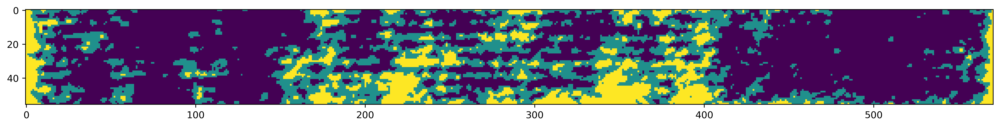

In [26]:
my_dpi = 200
plt.figure(figsize=(3665/my_dpi, 1808/my_dpi), dpi=my_dpi)
plt.imshow(im[1])

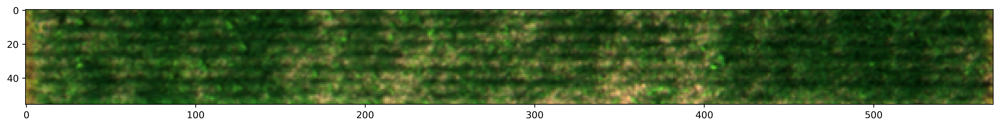

In [28]:
my_dpi = 200
plt.figure(figsize=(3665/my_dpi, 1808/my_dpi), dpi=my_dpi)
plt.imshow(viz_preprocess(blocks_7_6[1]))

In [29]:
# calib = pd.read_csv(CSV_LOCATION)
# calib = _get_widthnangle(calib)
minheight = 3021
minwidth = 1185

# minwidth = calib["width"].min()  # For scaling each image to the smallest image.
# calib.drop(index=6, axis=0, inplace=True)  # There's an image where the crop gets cut off.
for i in range(len(calib)-2):
    row = calib.iloc[i]
    print(i, row)

0 fileprefix    NobalWheat_NUE_10-8-2021_20m_transparent_refle...
tl_x                                                        929
tl_y                                                       1462
tr_x                                                       2146
tr_y                                                        891
bl_x                                                       2356
bl_y                                                       4561
br_x                                                       3590
br_y                                                       3989
middle_x                                                   2035
middle_y                                                   2773
angle                                                 -0.438694
width                                                    1344.3
Name: 0, dtype: object
1 fileprefix    NobalWheat_NUE_12-7-2021_20m_transparent_refle...
tl_x                                                        952
tl_y         

In [30]:
row

fileprefix    NobalWheat_NUE_4-8-2021_20m_transparent_reflec...
tl_x                                                        926
tl_y                                                       1627
tr_x                                                       2169
tr_y                                                       1056
bl_x                                                       2391
bl_y                                                       4803
br_x                                                       3653
br_y                                                       4216
middle_x                                                   2061
middle_y                                                   2970
angle                                                 -0.430621
width                                                   1367.88
Name: 8, dtype: object

In [31]:
rotated = _preprocess_single_image(row, minwidth, minheight, image_location)

/Users/anhelinalohvina/opt/anaconda3/envs/Daily/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


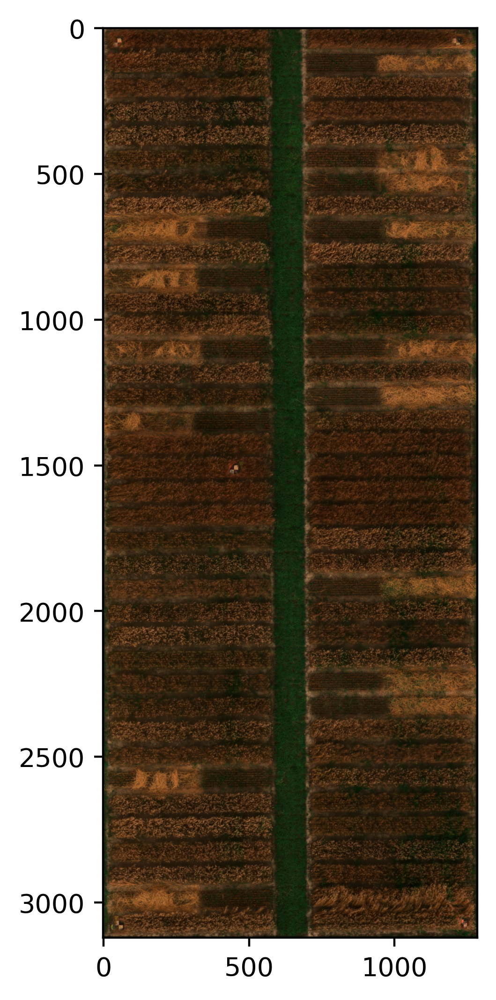

In [32]:
img = viz_preprocess(rotated)
my_dpi = 200
plt.figure(figsize=(image_viz.shape[0]/my_dpi, image_viz.shape[1]/my_dpi), dpi =my_dpi)
plt.imshow(img)

In [33]:
indeces = get_indeces(rotated)

print(len(indeces))

for index in indeces:
    rotated = np.concatenate([rotated, np.expand_dims(index, axis=-1)], axis=-1)

13


In [41]:
im, s = kmeans_model(rotated)

In [36]:
s

[Counter({0.5: 29960, 1.0: 4871}),
 Counter({0.5: 26509, 1.0: 5467}),
 Counter({0.5: 34193, 1.0: 4635}),
 Counter({0.5: 24978, 1.0: 6427}),
 Counter({0.5: 31022, 1.0: 3809})]

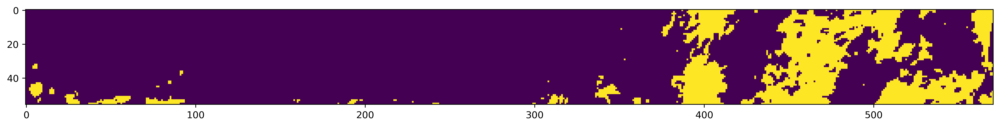

In [37]:
my_dpi = 200
plt.figure(figsize=(3665/my_dpi, 1808/my_dpi), dpi=my_dpi)
plt.imshow(im[1])

In [38]:
blocks_4_8 = list(block_breakup(rotated, top=20, bottom=0, left=5, right=5))

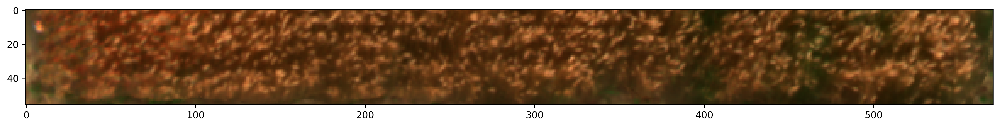

In [39]:
my_dpi = 200
plt.figure(figsize=(3665/my_dpi, 1808/my_dpi), dpi=my_dpi)
plt.imshow(viz_preprocess(blocks_4_8[1]))

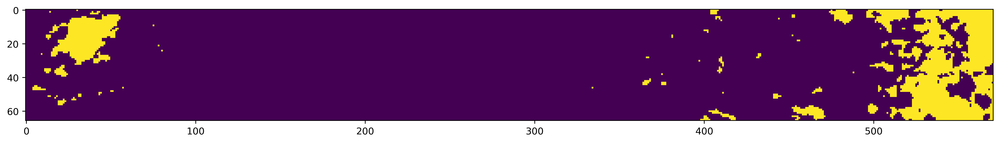

In [42]:
my_dpi = 200
plt.figure(figsize=(3665/my_dpi, 1808/my_dpi), dpi=my_dpi)
plt.imshow(im[8])

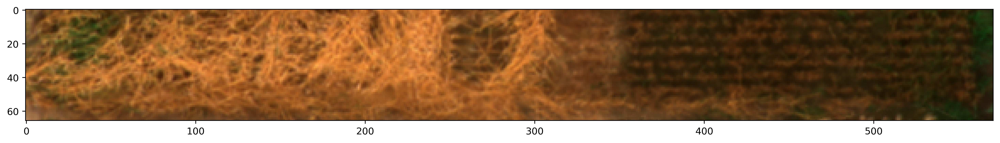

In [43]:
my_dpi = 200
plt.figure(figsize=(3665/my_dpi, 1808/my_dpi), dpi=my_dpi)
plt.imshow(viz_preprocess(blocks_4_8[8]))